In [1]:
import pandas as pd
import matplotlib.pyplot as plt
# pd.options.plotting.backend = "plotly"
import numpy as np
from sklearn import preprocessing
import seaborn as sns
from datetime import datetime
# from IPython.core.display import display, HTML
#d isplay(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option("display.max_columns", None) # Muestra todas las columnas de los DF
import scipy.stats as stats

# DEFINICIÓN DE FUNCIONES

In [26]:
def display_dataset_distributions(dataset, n_bins = 20):
    pd.options.plotting.backend = 'matplotlib'
    fig = dataset.hist(xlabelsize=12, ylabelsize=12,figsize=(22,10), bins = n_bins)
    [x.title.set_size(14) for x in fig.ravel()]
    plt.tight_layout()
    plt.show()

def plot_corrMatrix(data, method):
    import seaborn as sns
    corr = data.corr(method = method)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    fig, ax = plt.subplots(figsize=(20,17))
    sns.heatmap(corr, mask=mask, cmap=cmap, square=True,center=0, annot=True, ax=ax)

def make_mi_scores(X, y, discrete_features = 'auto'):
    from sklearn.feature_selection import mutual_info_regression
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    
    mi_scores = mi_scores.sort_values(ascending=True)
    width = np.arange(len(mi_scores))
    ticks = list(mi_scores.index)
    plt.figure(dpi=100, figsize=(12, 7))
    plt.barh(width, mi_scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

def outlier_diagnostic_plots(df, labels):
    pd.options.plotting.backend = 'matplotlib'
    for i in labels:
        
        fig,axes = plt.subplots(1,3,figsize=(20,4))

        sns.histplot(df[i], bins=30,ax=axes[0], kde=True)
        axes[0].set_title('Histograma')

        stats.probplot(df[i], dist="norm", plot=axes[1])
        axes[1].set_title('QQ')

        # boxplot    
        sns.boxplot(y=df[i],ax=axes[2])
        axes[2].set_title('Box&Whiskers')

def outlier_describe(df, labels):
    data = df[labels]
    q25, q75 = df[labels].quantile(0.25), data.quantile(0.75) # Calculo los cuantíles
    iqr = q75 - q25 # Calculo el rango intercuartílico
    cutoff = iqr * 1.5 # Valor a partir del cual considero un outlier
    lower,upper = q25 - cutoff, q75 + cutoff # Límite inferior y superior
    ol_cant = len(df[(df[labels] < lower) | (df[labels] > upper)][labels])
    ol_percent = ol_cant * 100 / len(data)
    print('La cantidad de outliers extremos es: '+str(ol_cant)+' y representa el '+str(ol_percent)+'% del total de los datos')
    return lower, upper

def interactive_plots(data, labels = 0, backend = 'plotly'):
    pd.options.plotting.backend = backend
    if labels != 0:
        data[labels].plot()
    if labels == 0:
        data.plot()
    
def make_corr_scores(X, y):
    import scipy.stats
    corr_scores = []
    corr_scores = np.array(corr_scores)
    for i in X.columns:
        # print(corr_scores,np.corrcoef(X[i], y)[0,1])
        corr_scores = np.append(corr_scores,abs(np.corrcoef(X[i], y)[0,1]))
    corr_scores = pd.Series(corr_scores, name="MI Scores", index=X.columns)
    corr_scores = corr_scores.sort_values(ascending = True)
    width1 = np.arange(len(corr_scores))
    ticks = list(corr_scores.index)
    
    corr_scores2 = []
    corr_scores2 = np.array(corr_scores2)
    for i in X.columns:
        # print(corr_scores,np.corrcoef(X[i], y)[0,1])
        corr_scores2 = np.append(corr_scores2,abs(scipy.stats.spearmanr(X[i], y)[0]))
    corr_scores2 = pd.Series(corr_scores2, name="MI Scores", index=X.columns)
    corr_scores2 = corr_scores2.sort_values(ascending = True)
    width2 = np.arange(len(corr_scores2))
    ticks = list(corr_scores2.index)
    
    corr_scores3 = []
    corr_scores3 = np.array(corr_scores3)
    for i in X.columns:
        # print(corr_scores,np.corrcoef(X[i], y)[0,1])
        corr_scores3 = np.append(corr_scores3,abs(scipy.stats.kendalltau(X[i], y)[0]))
    corr_scores3 = pd.Series(corr_scores3, name = "MI Scores", index = X.columns)
    corr_scores3 = corr_scores3.sort_values(ascending = True)
    width3 = np.arange(len(corr_scores3))
    ticks = list(corr_scores3.index)
    
    
    plt.figure(dpi=100, figsize=(17, 10))
    plt.barh(width1, corr_scores, label = 'Pearson R', height = 0.3)
    plt.barh(width2+0.3, corr_scores2,  label = 'Spearman Rho', height = 0.3)
    plt.barh(width3+0.6, corr_scores3, label = 'Kendall Tau', height = 0.3)
    plt.yticks(width1, ticks)
    plt.title("CORRELATION SCORES")
    plt.legend()
    
#     print(corr_scores)
#     return pd.DataFrame([X.columns, corr_scores.T])

# IMPORTACIÓN DE LOS DATOS

In [3]:
data  = pd.read_pickle('./TO_FE_20211117.pkl')

In [4]:
data.head()

,Humedad_Semilla,T_Mat_entrada,T_Solvente,Q_Solvente,T_Lam_9,Planta_Marcha,Ritmo_Molienda,Q_Miscela,Vel_Extractor,Conc_Miscela,Valid_NIR_Salida_Ext,MG_NIR_Salida_Ext,Solvente_NIR_Salida_Ext,LT-17,Conc_P3-1,Conc_P3-2,Conc_P3-3,Conc_P3-4,Conc_P3-5,Conc_P3-6,Conc_P3-7,Conc_P3-8,Conc_P3-9,Conc_P3-10,Conc_P3-11,Conc_P1,TT-35-GI,TT-35-GO
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-07 15:00:00,11.220576,55.351233,64.760113,175629.031771,41.242286,0.0,118.344444,121533.812674,0.246375,22.914308,0.0,0.935554,27.462111,69.963710,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.569140,21.890252
2021-10-07 15:03:00,11.220576,56.127179,63.062280,161327.780556,41.399019,0.0,118.244444,121238.562760,0.244367,23.888520,0.0,0.937291,27.400500,68.430747,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55.273350,21.778762
2021-10-07 15:06:00,11.215690,56.793592,63.125998,180710.897569,41.553339,0.0,118.450000,120906.255903,0.244367,24.869473,0.0,1.065928,27.373222,68.783274,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.571460,21.391000
2021-10-07 15:09:00,11.218207,57.290494,62.214238,167809.760069,41.690781,0.0,119.288889,120956.571007,0.244367,25.291922,0.0,1.010382,27.381889,70.890278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55.036835,21.388528
2021-10-07 15:12:00,11.220576,57.504946,65.110470,163657.721007,41.813755,0.0,121.000000,121055.589670,0.244367,25.319496,0.0,1.012769,27.493389,74.577987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55.211591,21.378913


# ANÁLISIS EXPLORATORIO DE LOS DATOS

In [5]:
pd.options.plotting.backend = 'plotly'
data.plot()

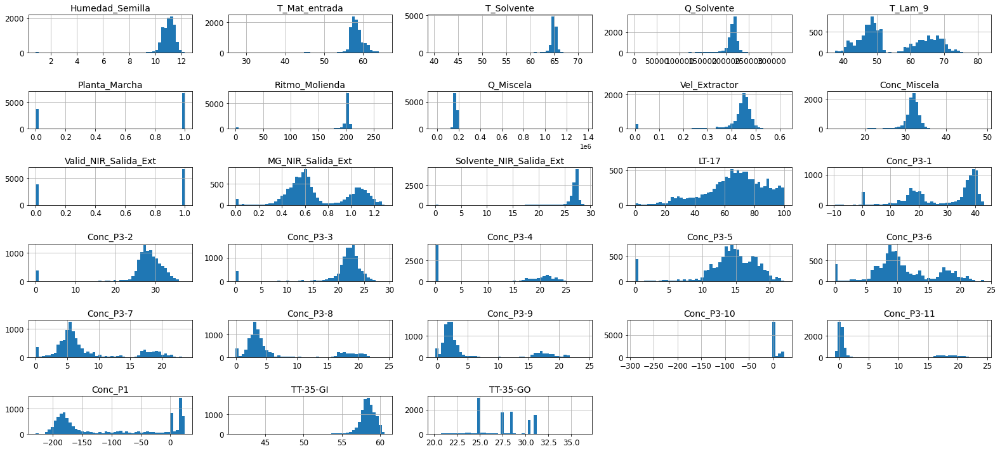

In [6]:
display_dataset_distributions(data, n_bins = 50)

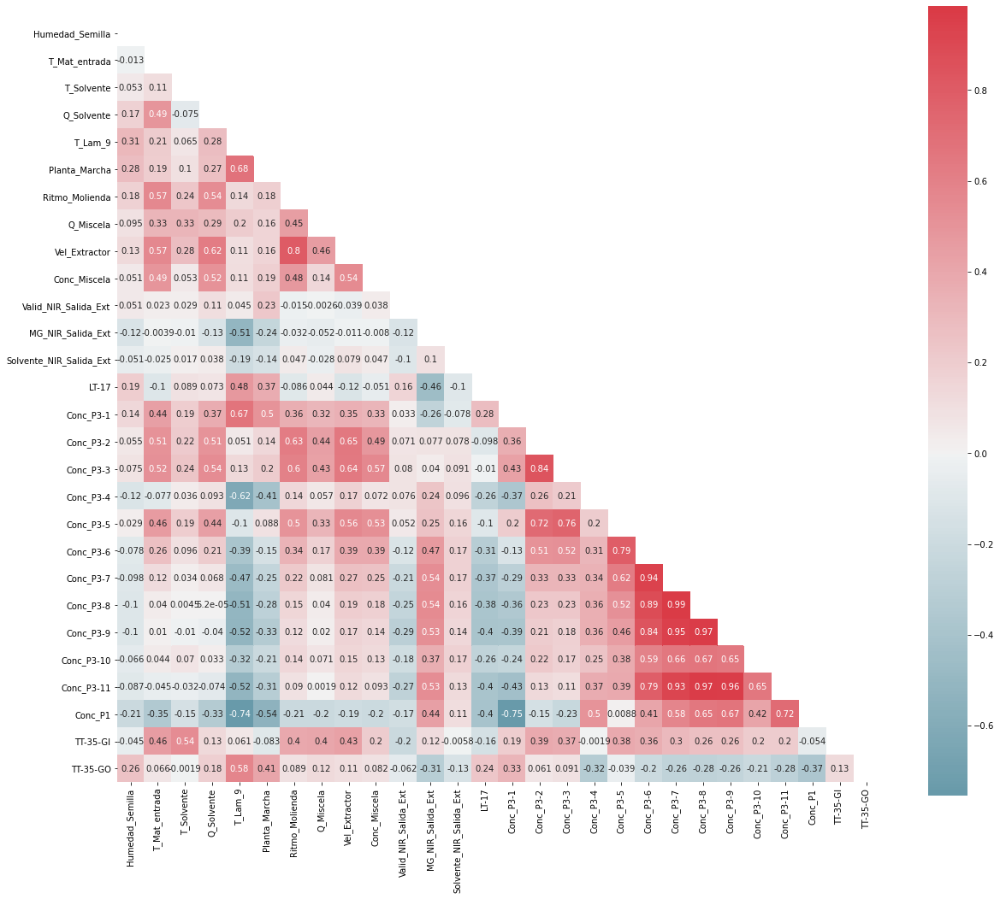

In [7]:
plot_corrMatrix(data, method = 'pearson')

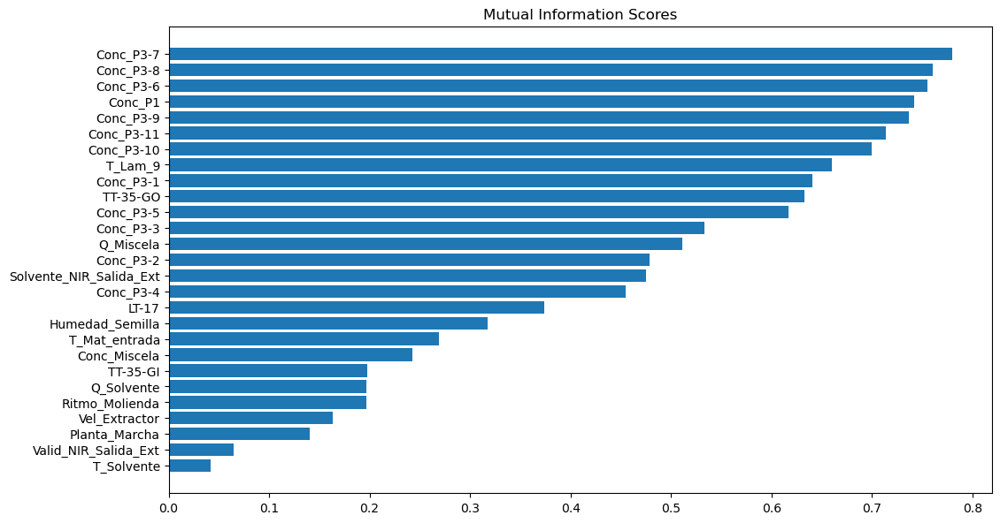

In [8]:
make_mi_scores(data.drop(columns = 'MG_NIR_Salida_Ext'), data['MG_NIR_Salida_Ext'])

## Análisis de la MG en función de T_Lam_9
Observando la distribución de T_Lam_9 y de MG_NIR_Salida_Ext encontramos distribuciones bimodales en ambos casos.
De análisis previos se cree que la temperatura en el laminado puede afectar indirectamente el residual de MG al estar relacionado con la calidad de laminado.
Para evaluar si existe una relación entre los modos de ambas distribuciones, creamos la variable *T_Lam_9_55* que asigna 0 a valores menores de 55° y 1 a los valores mayores de 55°.

Como resultado de graficar las distribuciones de la MG en función de la nueva variable, **podemos reforzar la hipótesis de que a medida que la temperatura de laminado es menor, aumenta el contenido de MG remanente en la harina a la salida del extractor.**

In [9]:
data['T_Lam_9_55'] = np.zeros(len(data)) # Creo una nueva feature que corresponde a valores de T_Lam_9 > 55°
data.loc[data['T_Lam_9']>55, 'T_Lam_9_55'] = 1 # Le asigno 1 si T_Lam_9 > 55°

C:\Users\alexb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='MG_NIR_Salida_Ext', ylabel='T_Lam_9'>

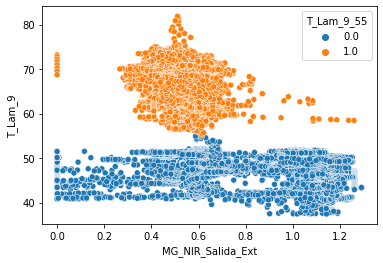

In [10]:
sns.scatterplot(data['MG_NIR_Salida_Ext'], data['T_Lam_9'], hue=data['T_Lam_9_55'])

<AxesSubplot:xlabel='T_Lam_9_55', ylabel='MG_NIR_Salida_Ext'>

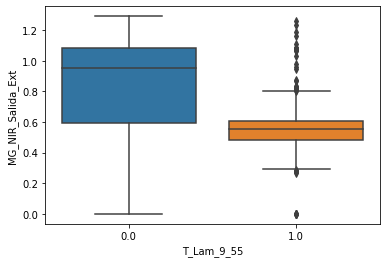

In [11]:
sns.boxplot(x="T_Lam_9_55", y="MG_NIR_Salida_Ext", data=data)

# Análisis de Humedad de semilla

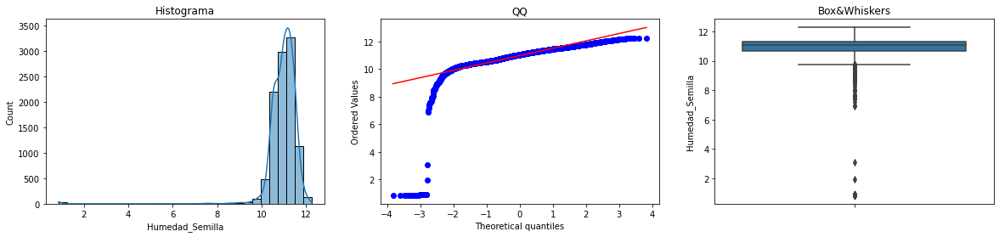

In [12]:
outlier_diagnostic_plots(data, ['Humedad_Semilla'])

In [13]:
lo, up = outlier_describe(data, 'Humedad_Semilla')

La cantidad de outliers extremos es: 139 y representa el 1.331290106311656% del total de los datos


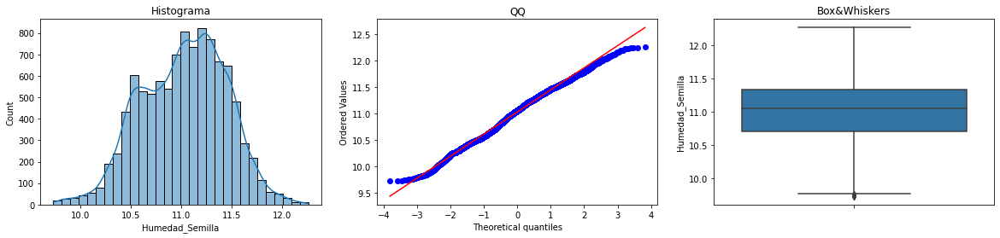

In [14]:
outlier_diagnostic_plots(data[(data['Humedad_Semilla'].values > lo) & (data['Humedad_Semilla'].values < up)], ['Humedad_Semilla'])

In [15]:
# Descarto las realizaciones que contienen outliers en la variable Humedad_Semilla ya que es menor al 5 %
OL_index = data[(data['Humedad_Semilla'].values < lo) | (data['Humedad_Semilla'].values > up)].index
data.drop(index = OL_index, inplace = True)

# NORMALIZACIÓN DE LOS DATOS

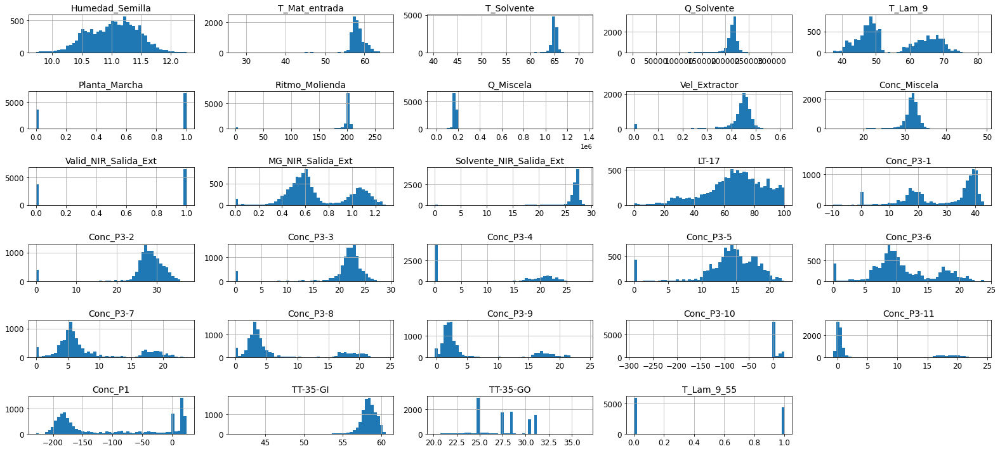

In [16]:
# Distribuciones antes de la normalización
display_dataset_distributions(data, n_bins = 50)

In [17]:
# Variables a normalizar

from sklearn.preprocessing import QuantileTransformer, PowerTransformer, MinMaxScaler
from sklearn.pipeline import Pipeline 

quantile = QuantileTransformer(output_distribution= 'normal')
vars_to_norm = ['Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente', 'Ritmo_Molienda', 'Q_Miscela', 'Vel_Extractor', 'Conc_Miscela', 'Solvente_NIR_Salida_Ext', 'LT-17', 'Conc_P3-2', 'Conc_P3-3', 'Conc_P3-5', 'TT-35-GI']
aux_data_nomalized = quantile.fit_transform(data[vars_to_norm])
data_norm = data.drop(columns = vars_to_norm)
data_norm[vars_to_norm] = aux_data_nomalized

# Escalo todas las features entre 0-1
vars_to_norm = data_norm.columns
scaler = MinMaxScaler(feature_range=(0, 1))
data_norm[vars_to_norm] = scaler.fit_transform(data_norm[vars_to_norm])



# scaler = MinMaxScaler(feature_range=(1, 2)) # Box-Cox requiere que los valores de entrada sean positivos.
# power = PowerTransformer(method= 'box-cox' )
# pipeline = Pipeline(
#     steps=[
#         ( 's' , scaler),
#         ( 'p' , power)
# ])
# aux_data_nomalized = pipeline.fit_transform(data[vars_to_norm])
# data_norm = data.drop(columns = vars_to_norm)
# data_norm[vars_to_norm] = aux_data_nomalized

In [72]:
data.columns

Index(['Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente',
       'T_Lam_9', 'Planta_Marcha', 'Ritmo_Molienda', 'Q_Miscela',
       'Vel_Extractor', 'Conc_Miscela', 'Valid_NIR_Salida_Ext',
       'MG_NIR_Salida_Ext', 'Solvente_NIR_Salida_Ext', 'LT-17', 'Conc_P3-1',
       'Conc_P3-2', 'Conc_P3-3', 'Conc_P3-4', 'Conc_P3-5', 'Conc_P3-6',
       'Conc_P3-7', 'Conc_P3-8', 'Conc_P3-9', 'Conc_P3-10', 'Conc_P3-11',
       'Conc_P1', 'TT-35-GI', 'TT-35-GO', 'T_Lam_9_55'],
      dtype='object')

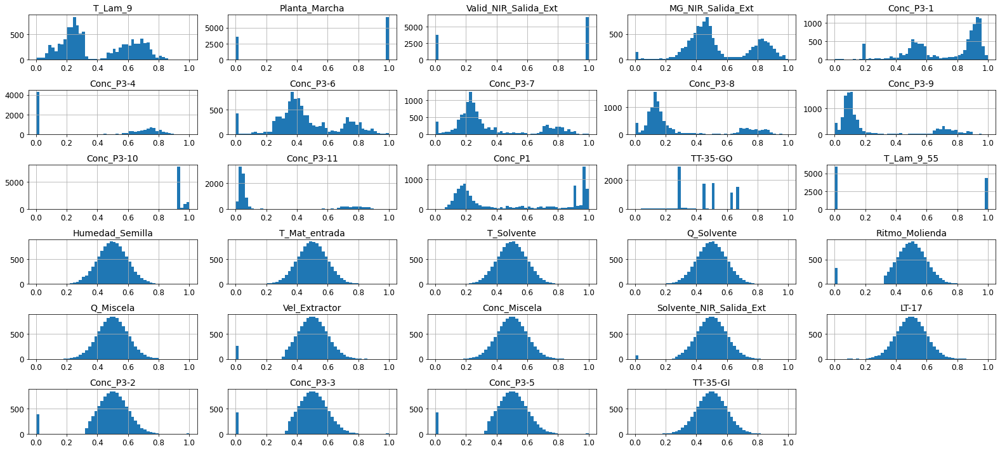

In [18]:
# Distribuciones utilizando quantile-transformer
display_dataset_distributions(data_norm, n_bins = 50)

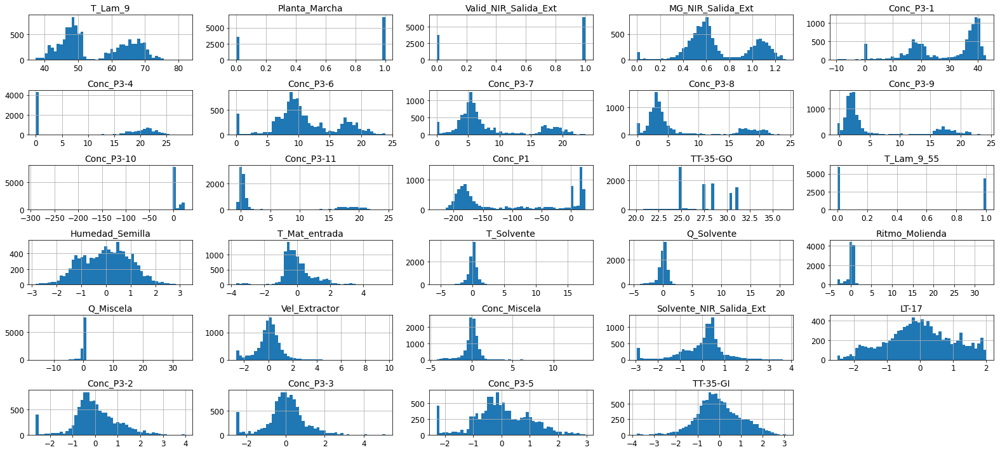

In [41]:
# # Distribuciones utilizando box-cox
# display_dataset_distributions(data_norm, n_bins = 50)

# DETECCIÓN DE OUTLIERS

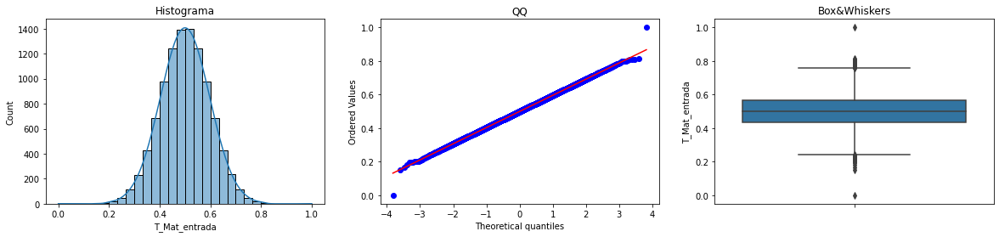

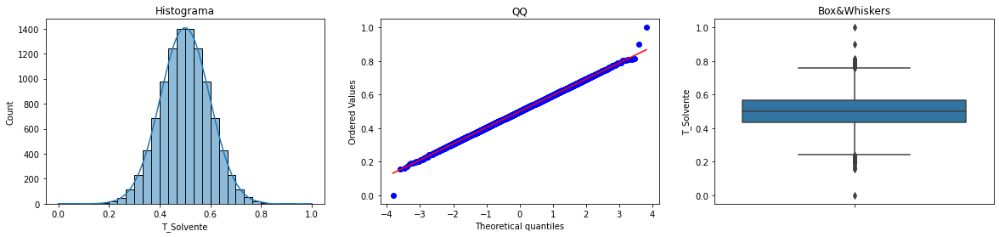

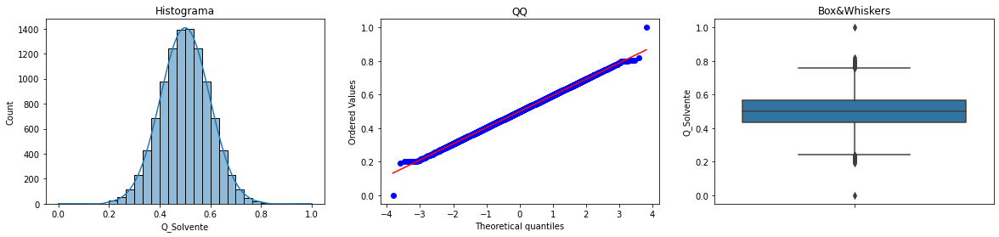

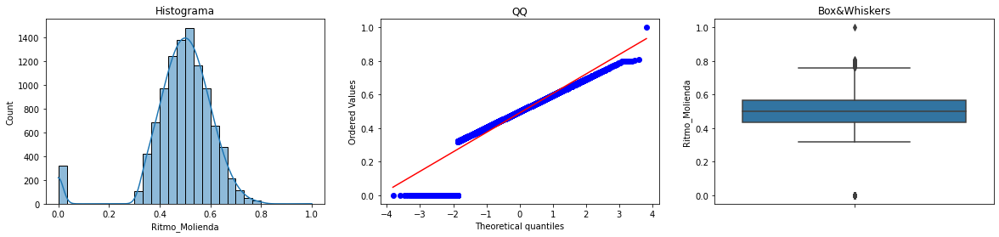

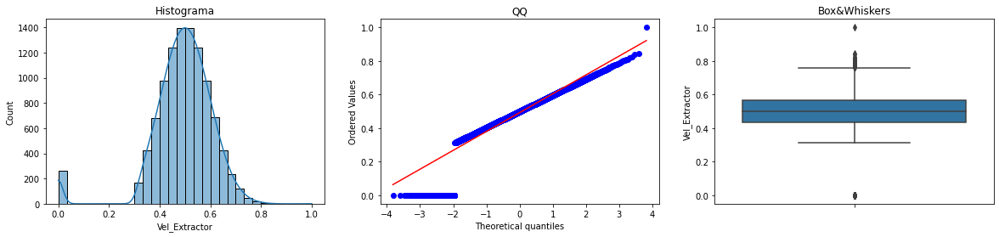

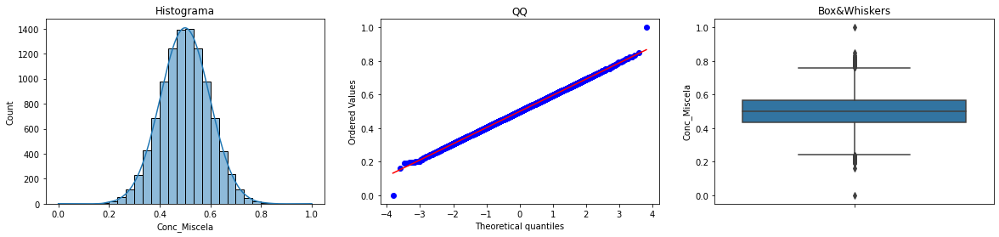

In [19]:
ol_labels = ['T_Mat_entrada', 'T_Solvente', 'Q_Solvente', 'Ritmo_Molienda', 'Vel_Extractor', 'Conc_Miscela']
outlier_diagnostic_plots(data_norm, ol_labels)

In [20]:
# Veo cuantos outliers hay por cada variable

for label in ol_labels:
    print(label)
    outlier_describe(data_norm, label)

T_Mat_entrada
La cantidad de outliers extremos es: 71 y representa el 0.689186565715395% del total de los datos
T_Solvente
La cantidad de outliers extremos es: 70 y representa el 0.67947971267715% del total de los datos
Q_Solvente
La cantidad de outliers extremos es: 71 y representa el 0.689186565715395% del total de los datos
Ritmo_Molienda
La cantidad de outliers extremos es: 359 y representa el 3.484760240729955% del total de los datos
Vel_Extractor
La cantidad de outliers extremos es: 299 y representa el 2.9023490584352554% del total de los datos
Conc_Miscela
La cantidad de outliers extremos es: 68 y representa el 0.6600660066006601% del total de los datos


La cantidad de outliers extremos es: 299 y representa el 2.9023490584352554% del total de los datos


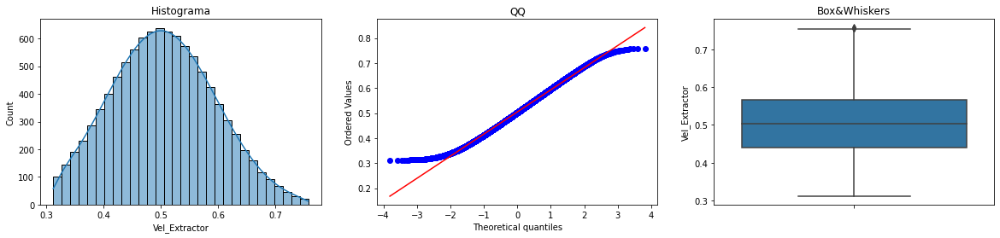

In [21]:
lo, up = outlier_describe(data_norm, 'Vel_Extractor')
# Descarto las realizaciones que contienen outliers en la variable Vel_Extractor ya que representan el 3% y son momentos operativos en donde las predicciones no son útiles
OL_index = data_norm[(data_norm['Vel_Extractor'].values < lo) | (data_norm['Vel_Extractor'].values > up)].index
data_norm.drop(index = OL_index, inplace = True)
outlier_diagnostic_plots(data_norm, ['Vel_Extractor'])

In [22]:
for label in ol_labels:
    print(label)
    outlier_describe(data_norm, label)

T_Mat_entrada
La cantidad de outliers extremos es: 51 y representa el 0.5098470458862341% del total de los datos
T_Solvente
La cantidad de outliers extremos es: 29 y representa el 0.28991302609217234% del total de los datos
Q_Solvente
La cantidad de outliers extremos es: 12 y representa el 0.11996401079676097% del total de los datos
Ritmo_Molienda
La cantidad de outliers extremos es: 122 y representa el 1.21963410976707% del total de los datos
Vel_Extractor
La cantidad de outliers extremos es: 5 y representa el 0.049985004498650405% del total de los datos
Conc_Miscela
La cantidad de outliers extremos es: 40 y representa el 0.39988003598920324% del total de los datos


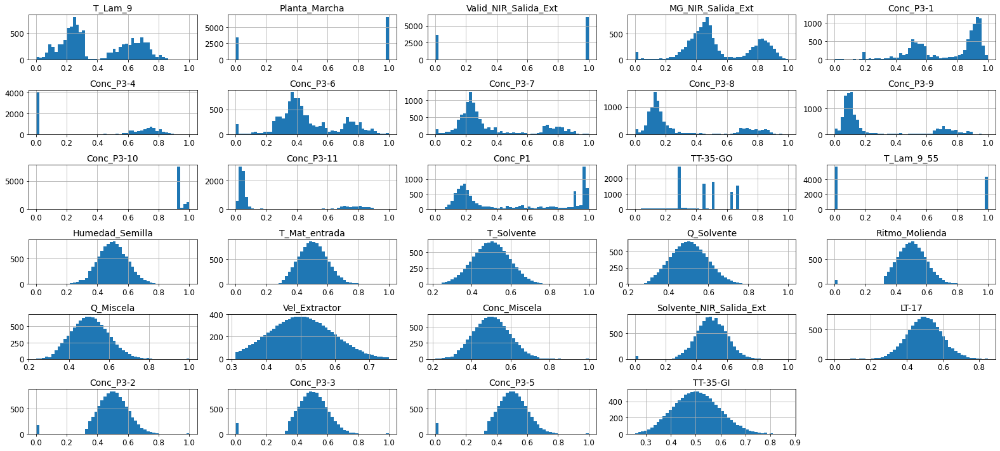

In [23]:
display_dataset_distributions(data_norm, n_bins = 50)

# ANÁLISIS DE CORRELACIÓN Y CIM

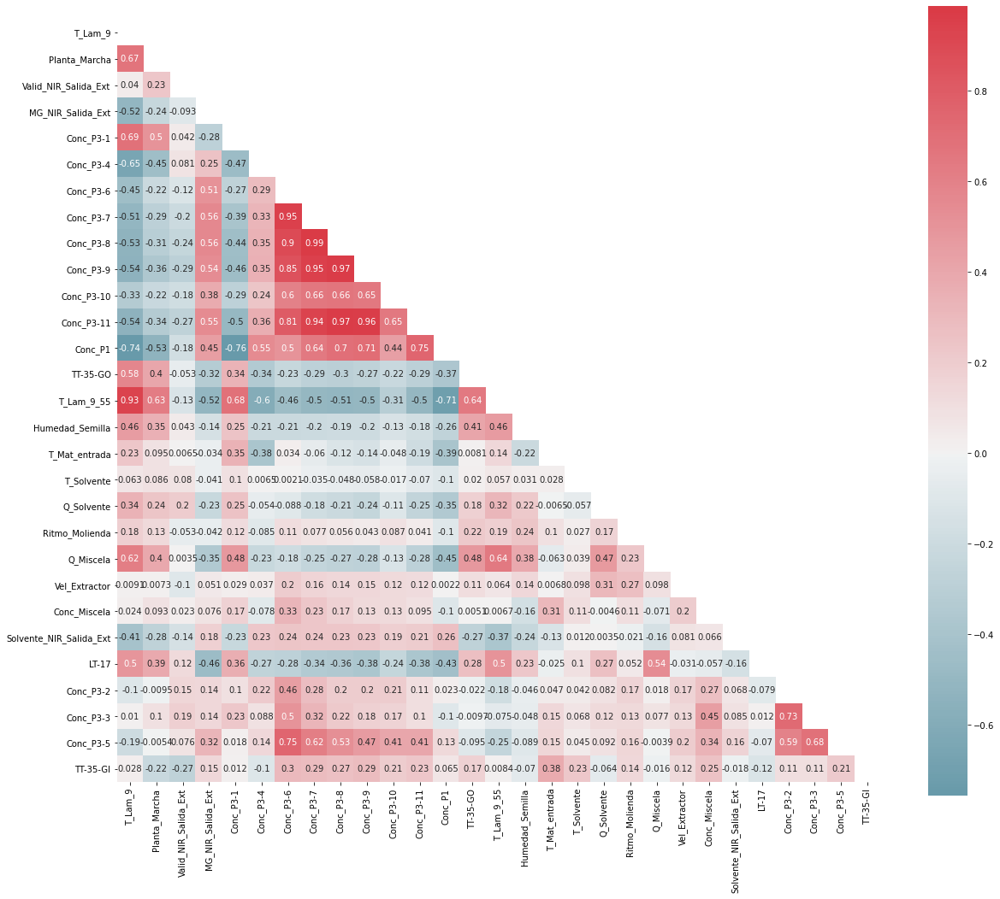

In [25]:
plot_corrMatrix(data_norm, method = 'pearson')

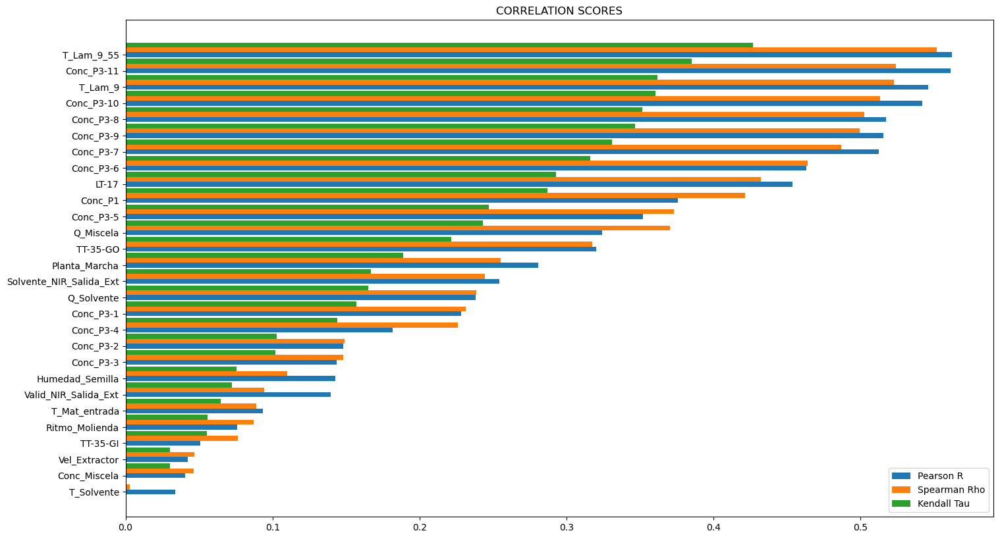

In [27]:
# Correlaciones para RainfallTomorrow
make_corr_scores(data_norm.drop(columns = ['MG_NIR_Salida_Ext']), data_norm['MG_NIR_Salida_Ext'])

Debido a la alta correlación entre las variables de concentración de las bombas *P3-x* conservo solamente P3-11 que es la que tiene un mayor score en CIM.

In [29]:
vars_to_drop = ['Conc_P3-1',
                'Conc_P3-2',
                'Conc_P3-3',
                'Conc_P3-4',
                'Conc_P3-5',
                'Conc_P3-6', 
                'Conc_P3-7', 
                'Conc_P3-8',
                'Conc_P3-9', 
                'Conc_P3-10', 
                'Conc_P1',
                'Planta_Marcha',
                'Valid_NIR_Salida_Ext']

In [31]:
data_norm.drop(columns = vars_to_drop, inplace = True)

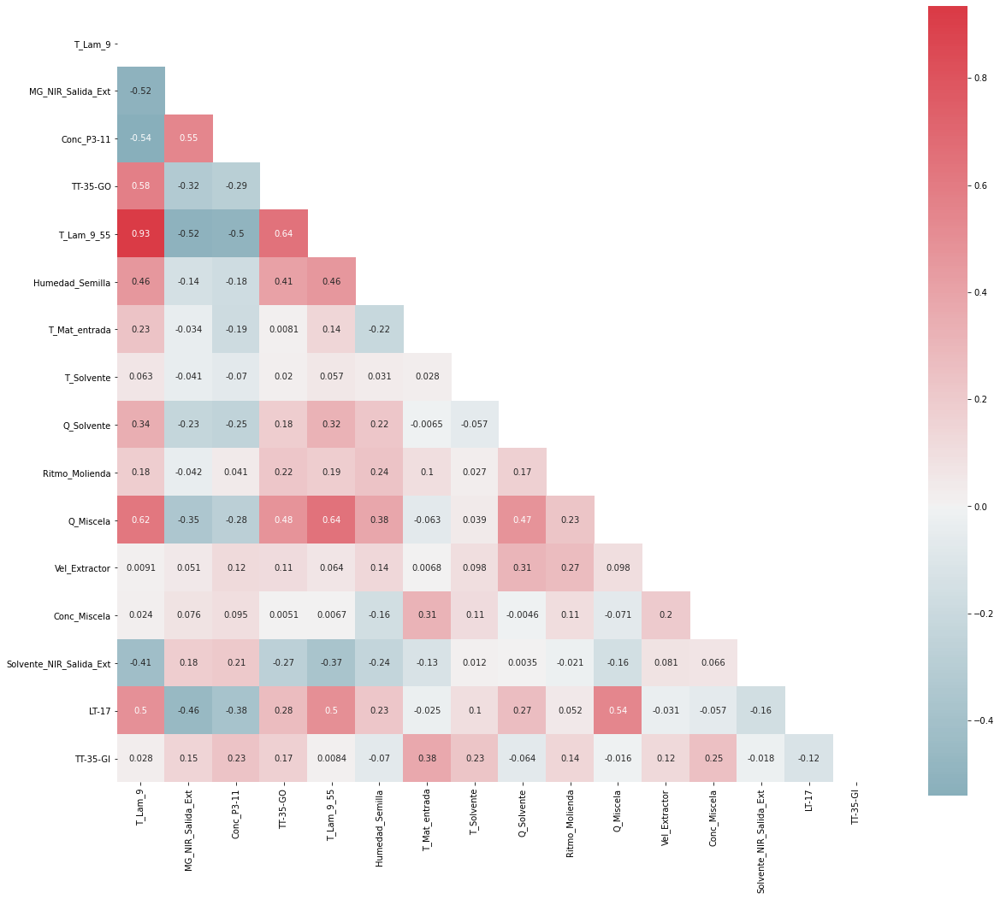

In [32]:
plot_corrMatrix(data_norm, method = 'pearson')

In [37]:
data_norm.columns

Index(['T_Lam_9', 'MG_NIR_Salida_Ext', 'Conc_P3-11', 'TT-35-GO', 'T_Lam_9_55',
       'Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente',
       'Ritmo_Molienda', 'Q_Miscela', 'Vel_Extractor', 'Conc_Miscela',
       'Solvente_NIR_Salida_Ext', 'LT-17', 'TT-35-GI'],
      dtype='object')

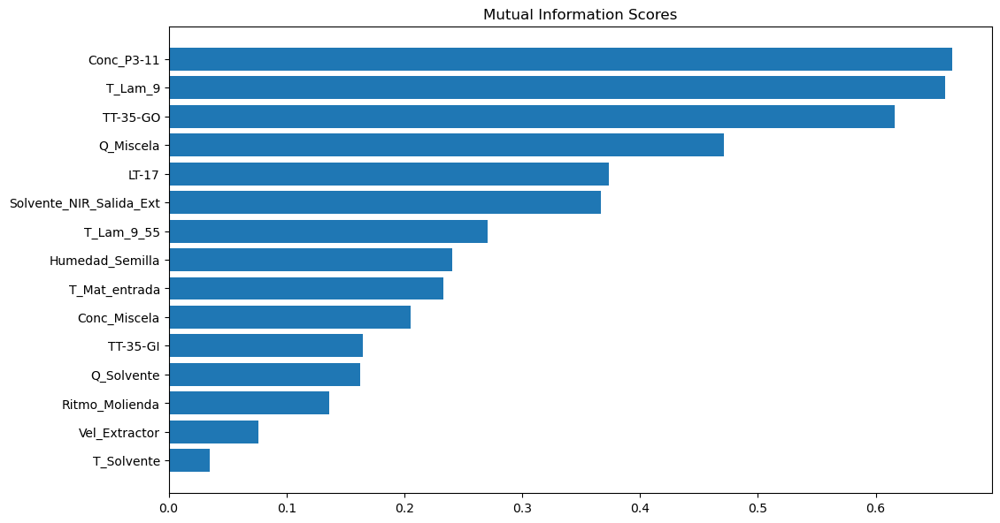

In [35]:
make_mi_scores(data_norm.drop(columns = 'MG_NIR_Salida_Ext'), data_norm['MG_NIR_Salida_Ext'])

In [34]:
# Exporto el training set para realizar feature selection con otros métodos de selección

data_norm.to_pickle('./To_FS_20211121.pkl')

# DEFINICIÓN DEL PIPELINE DE PREPROCESAMIENTO

In [38]:
from sklearn.base import BaseEstimator, TransformerMixin

# NORMALIZACIÓN DE LOS DATOS

In [39]:
class DataNormalization(BaseEstimator, TransformerMixin):
    def fit(self, data, parameters = None):
        
        print('\n DataNormalization() fit called.\n')
        data_ = data.copy()
        vars_to_norm = ['Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente', 'Ritmo_Molienda', 'Q_Miscela', 'Vel_Extractor', 'Conc_Miscela', 'Solvente_NIR_Salida_Ext', 'LT-17', 'Conc_P3-2', 'Conc_P3-3', 'Conc_P3-5', 'TT-35-GI']
        from sklearn.preprocessing import QuantileTransformer
        self.quantile = QuantileTransformer(output_distribution= 'normal')
        self.quantile.fit(data_[vars_to_norm])

        return self
    
    def transform(self, data):
        print('\n DataNormalization() transform called.\n')
        data_ = data.copy()

        vars_to_norm = ['Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente', 'Ritmo_Molienda', 'Q_Miscela', 'Vel_Extractor', 'Conc_Miscela', 'Solvente_NIR_Salida_Ext', 'LT-17', 'Conc_P3-2', 'Conc_P3-3', 'Conc_P3-5', 'TT-35-GI']
        aux_data_nomalized = self.quantile.transform(data_[vars_to_norm])
        data_norm = data_.drop(columns = vars_to_norm)
        data_norm[vars_to_norm] = aux_data_nomalized
        
        return data_norm

# ESCALADO DE LOS DATOS

In [40]:
class DataScaler(BaseEstimator, TransformerMixin):
    def fit(self, data, parameters = None):

        print('\n DataScaler() fit called.\n')        
        from sklearn.preprocessing import MinMaxScaler        
        data_ = data.copy()
        vars_to_scale = data_.columns
        self.scaler = MinMaxScaler(feature_range=(0, 1))
        self.scaler.fit(data_[vars_to_scale])

        return self
    
    def transform(self, data):
        print('\n DataScaler() transform called.\n')
        data_ = data.copy()

        vars_to_scale = data_.columns
        aux_data_scaled = self.scaler.transform(data_[vars_to_scale])
        data_scaled = data_.drop(columns = vars_to_scale)
        data_scaled[vars_to_scale] = aux_data_scaled
        
        return data_scaled

# SELECCIÓN DE FEATURES

In [51]:
class VariableSelection(BaseEstimator, TransformerMixin):
    def fit(self, data, parameters = None):
        print('\n VariableSelection() fit called.\n')
        return self
    
    def transform(self, data):
        print('\n VariableSelection() transform called.\n')
        data_ = data.copy()
       
        data_ = data_[['T_Lam_9', 'MG_NIR_Salida_Ext', 'Conc_P3-11', 'TT-35-GO',
       'Humedad_Semilla', 'T_Mat_entrada', 'T_Solvente', 'Q_Solvente',
       'Ritmo_Molienda', 'Q_Miscela', 'Vel_Extractor', 'Conc_Miscela',
       'Solvente_NIR_Salida_Ext', 'LT-17', 'TT-35-GI']]
        
        return data_

# PIPELINE

In [42]:
from sklearn.pipeline import Pipeline

In [52]:
PreProcessing_Pipeline = Pipeline(steps=[
    ('Normalization', DataNormalization()),
    ('Scaler', DataScaler()),
    ('Selection', VariableSelection())
    ])

In [53]:
train_set  = pd.read_pickle('./TO_FE_20211117.pkl')

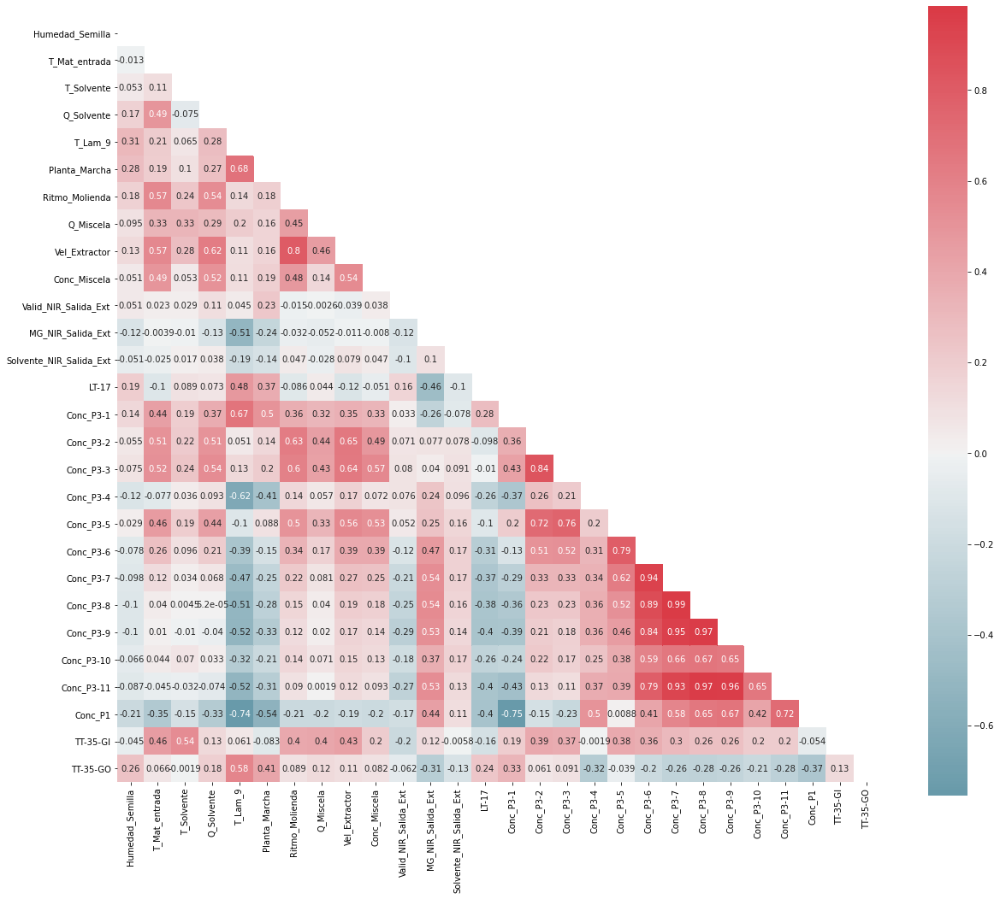

In [54]:
# Datos recién importados
plot_corrMatrix(train_set, 'pearson')

In [55]:
PreProcessing_Pipeline.fit(train_set)


 DataNormalization() fit called.


 DataNormalization() transform called.


 DataScaler() fit called.


 DataScaler() transform called.


 VariableSelection() fit called.



Pipeline(steps=[('Normalization', DataNormalization()),
                ('Scaler', DataScaler()), ('Selection', VariableSelection())])

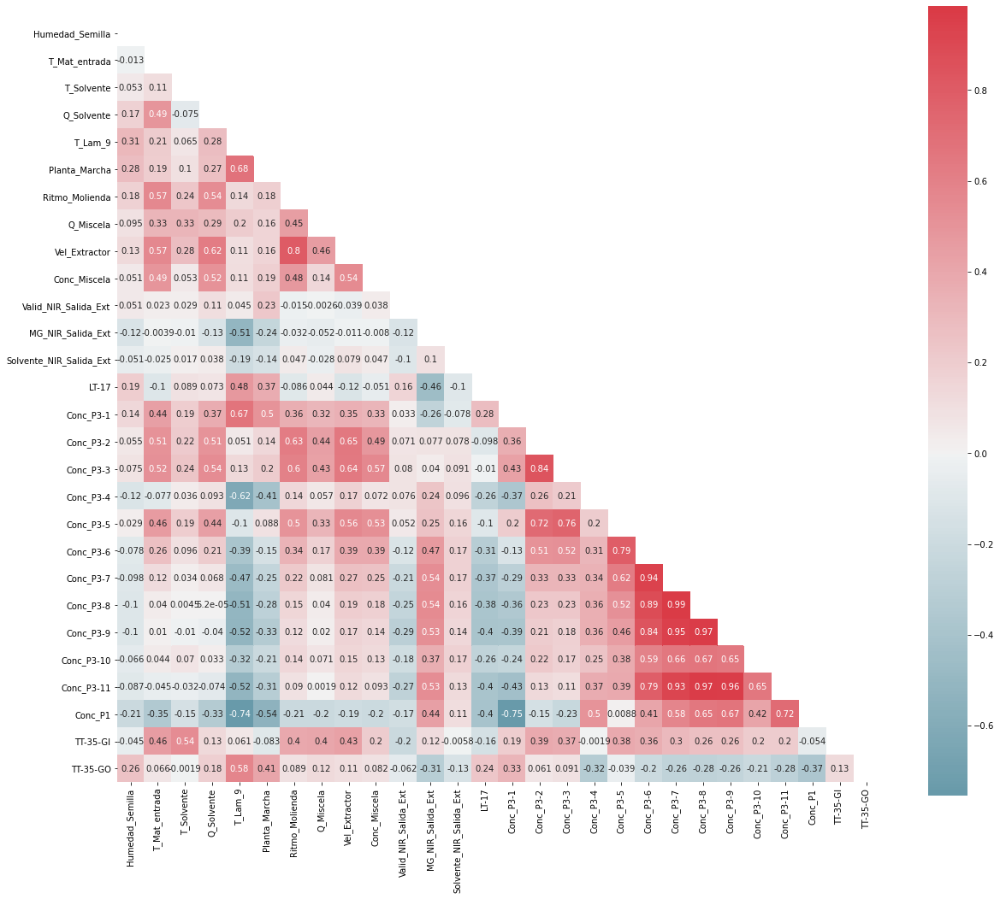

In [56]:
# Datos despues del fit
plot_corrMatrix(train_set, 'pearson')

In [57]:
train_set_preprocessed = PreProcessing_Pipeline.transform(train_set)


 DataNormalization() transform called.


 DataScaler() transform called.


 VariableSelection() transform called.



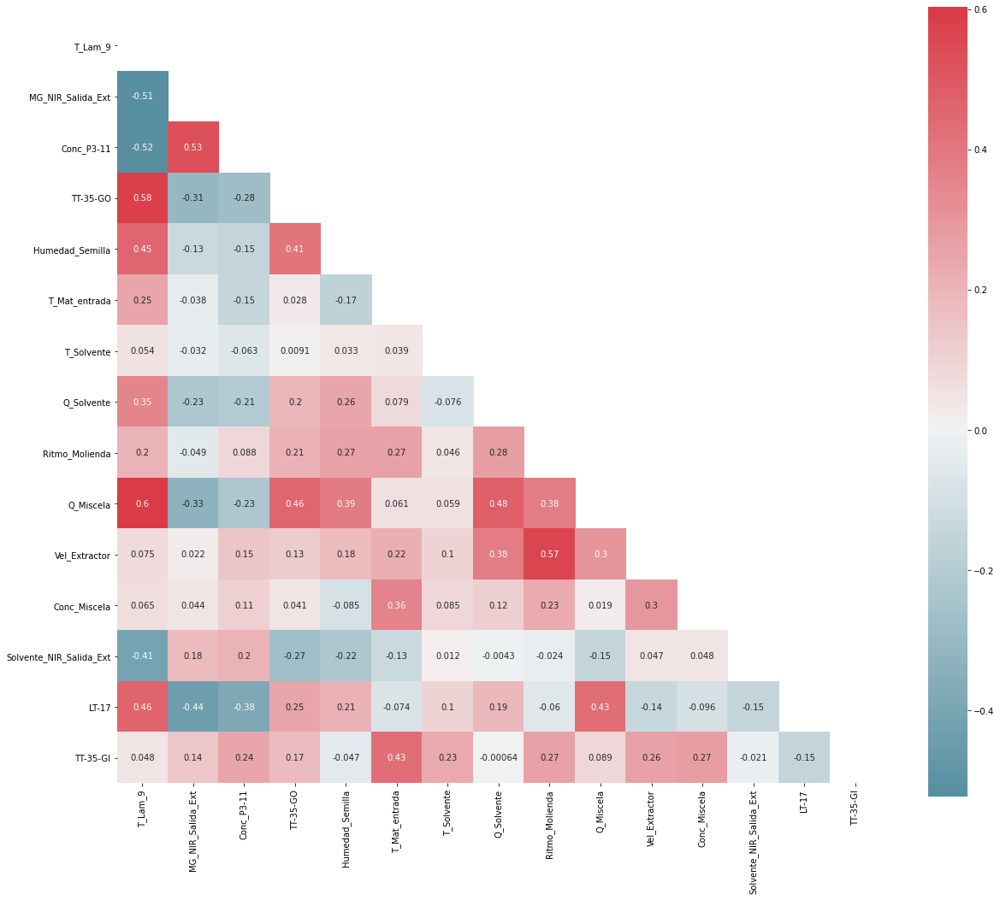

In [58]:
plot_corrMatrix(train_set_preprocessed, method = 'pearson')